# Fitting curves with neural nets

One way to think of what neural nets do is that they take a collection of examples, fit a complicated function to them, and then allow you to evaluate that function anywhere. The function "interpolates" between the examples. But what sort of interpolation is it really doing? What shapes of function does it prefer?

Let's explore this with a very simple case: we'll take a single specific 1-D function, sampled at a finite numebr of points, and try to teach a neural net to replicate it. Then we'll evaluate the function at more points and see how it resembles (or doesn't) the input function.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor


Let's make a curve with a few bumps and see if we can train the neural net to replicate it.

In [56]:
np.random.seed(3)
n_train = 1000
n_test = 1000
n_peaks = 3

funcs = np.array(
    [
        (
            np.exp(0.5 * np.random.standard_normal(1) - 3),
            np.exp(2 * np.random.standard_normal(1) + 1),
            np.random.uniform(size=1),
        )
        for _ in range(n_peaks)
    ]
)[:, :, 0]


def sample_vals(x):
    r = np.zeros_like(x)
    for a, kappa, loc in funcs:
        f = scipy.stats.vonmises(kappa=kappa, loc=2 * np.pi * loc)
        r += a * f.pdf(2 * np.pi * x) * 2 * np.pi
    return r


def mean_vals(n):
    x = np.linspace(0, 1, n + 1)
    r = np.zeros_like(x[:-1])
    for a, kappa, loc in funcs:
        f = scipy.stats.vonmises(kappa=kappa, loc=2 * np.pi * loc)
        r += a * (f.cdf(x[1:] * 2 * np.pi) - f.cdf(x[:-1] * 2 * np.pi))
    return r * n


train_input_np = np.random.uniform(size=n_train)
train_output_np = sample_vals(train_input_np)
test_input_np = np.random.uniform(size=n_test)
test_output_np = sample_vals(test_input_np)


(0.0, 0.8353608007399562)

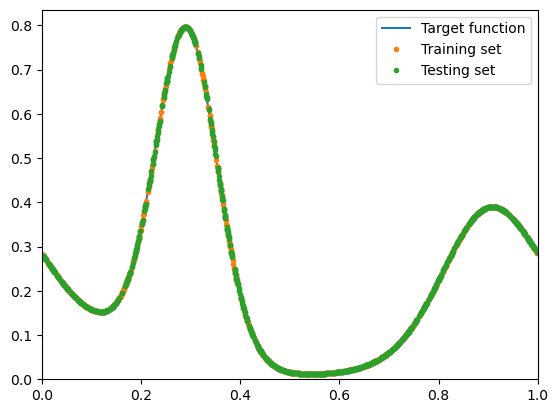

In [57]:
n = 4096
plt.plot(np.linspace(0, 1, n, endpoint=False), mean_vals(n), label="Target function")
plt.plot(train_input_np, train_output_np, ".", label="Training set")
plt.plot(test_input_np, test_output_np, ".", label="Testing set")
plt.legend()
plt.xlim(0, 1)
plt.ylim(ymin=0)


We have to do some slightly weird indexing here because the neural networks expect inputs to be at least one-dimensional, and ours is a simple (zero-dimensional) scalar.

We also need to pick the batch size here.

In [77]:
train_input = torch.from_numpy(train_input_np.astype(np.float32))
train_output = torch.from_numpy(train_output_np.astype(np.float32))
test_input = torch.from_numpy(test_input_np.astype(np.float32))
test_output = torch.from_numpy(test_output_np.astype(np.float32))


class PointDataset(Dataset):
    def __init__(self, input_tensor, output_tensor):
        self.input_tensor = input_tensor
        self.output_tensor = output_tensor

    def __len__(self):
        return len(self.input_tensor)

    def __getitem__(self, idx):
        return self.input_tensor[None, idx], self.output_tensor[None, idx]


train_dataset = PointDataset(train_input, train_output)
# train_dataloader = DataLoader(train_dataset, batch_size=len(test_dataset), shuffle=True)
# train_dataloader = DataLoader(train_dataset, batch_size=100, shuffle=True)
train_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True)
test_dataset = PointDataset(test_input, test_output)
test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)


Here we can experiment with different neural network structures.

The activation function ReLU is supposed to be great for most purposes, but you can easily wind up with zero gradients, which worries me. So I'll use LeakyReLU.

The machine I'm developing this on has an ancient GPU, so PyTorch reports that CUDA is available then raises an exception when you try to actually use it. So I'm forcing CPU use.

In [78]:
device = "cpu"


class NeuralNetwork(nn.Module):
    def __init__(self, layers):
        super(NeuralNetwork, self).__init__()
        s = [nn.Linear(1, layers[0])]
        for n, m in zip(layers[:-1], layers[1:]):
            s.append(nn.LeakyReLU())
            s.append(nn.Linear(n, m))
        s.append(nn.LeakyReLU())
        s.append(nn.Linear(layers[-1], 1))

        self.linear_relu_stack = nn.Sequential(*s)

    def forward(self, x):
        return self.linear_relu_stack(x)


model = NeuralNetwork([10] * 3).to(device)
model = NeuralNetwork([10*3] * 3).to(device)


NeuralNetwork(
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=1, out_features=30, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=30, out_features=30, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=30, out_features=30, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=30, out_features=1, bias=True)
  )
)


In [79]:
print(f"Model structure: {model}\n\n")

for name, param in model.named_parameters():
    print(f"Layer: {name} | Size: {param.size()} | Values : {param[:2]} \n")


Model structure: NeuralNetwork(
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=1, out_features=30, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=30, out_features=30, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=30, out_features=30, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=30, out_features=1, bias=True)
  )
)


Layer: linear_relu_stack.0.weight | Size: torch.Size([30, 1]) | Values : tensor([[-0.8709],
        [ 0.4537]], grad_fn=<SliceBackward0>) 

Layer: linear_relu_stack.0.bias | Size: torch.Size([30]) | Values : tensor([0.7576, 0.5682], grad_fn=<SliceBackward0>) 

Layer: linear_relu_stack.2.weight | Size: torch.Size([30, 30]) | Values : tensor([[ 0.0324,  0.1552,  0.1491,  0.0429, -0.1613, -0.1057, -0.1811,  0.1704,
          0.0249, -0.0365,  0.0661,  0.0953, -0.0376, -0.1158, -0.0095,  0.1591,
         -0.0264, -0.0541,  0.0957, -0.0812, -0.0312,  0.0469, -0.1739

Experimentation shows that the optimizers take *lots* of epochs to converge at all.

In [80]:
learning_rate = 1e-2
epochs = 1000

loss_fn = nn.MSELoss()


The different optimizers behave differently.

In [81]:
# optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
# optimizer = torch.optim.Adadelta(model.parameters())


def train_loop(dataloader, model, loss_fn, optimizer):
    for batch, (x, y) in enumerate(dataloader):
        pred = model(x)
        loss = loss_fn(pred, y)

        optimizer.zero_grad()
        # calling backward() here tells the optimizer that this is what should be optimized
        loss.backward()
        optimizer.step()

        print(f"mean squared error: {loss.item():>7f} [{batch:>5d}]")


def test_loop(dataloader, model, loss_fn):
    with torch.no_grad():
        for batch, (x, y) in enumerate(dataloader):
            pred = model(x)
            loss = loss_fn(pred, y)

            print(f"Test mean squared error: {loss.item():>7f}  [{batch:>5d}]\n")


for t in range(epochs):
    print(f"Epoch {t+1}\n-----------------------")
    train_loop(train_dataloader, model, loss_fn, optimizer)
    test_loop(test_dataloader, model, loss_fn)


Epoch 1
-----------------------
mean squared error: 0.181538 [    0]
mean squared error: 0.058524 [    1]
mean squared error: 0.047571 [    2]
mean squared error: 0.073183 [    3]
mean squared error: 0.077636 [    4]
mean squared error: 0.069192 [    5]
mean squared error: 0.043002 [    6]
mean squared error: 0.057303 [    7]
mean squared error: 0.069947 [    8]
mean squared error: 0.100270 [    9]
mean squared error: 0.047931 [   10]
mean squared error: 0.042898 [   11]
mean squared error: 0.069072 [   12]
mean squared error: 0.068765 [   13]
mean squared error: 0.053561 [   14]
mean squared error: 0.022942 [   15]
mean squared error: 0.043827 [   16]
mean squared error: 0.028119 [   17]
mean squared error: 0.020273 [   18]
mean squared error: 0.057723 [   19]
mean squared error: 0.093091 [   20]
mean squared error: 0.055162 [   21]
mean squared error: 0.045768 [   22]
mean squared error: 0.131495 [   23]
mean squared error: 0.031656 [   24]
mean squared error: 0.043491 [   25]
mean s

(0.0, 1.0)

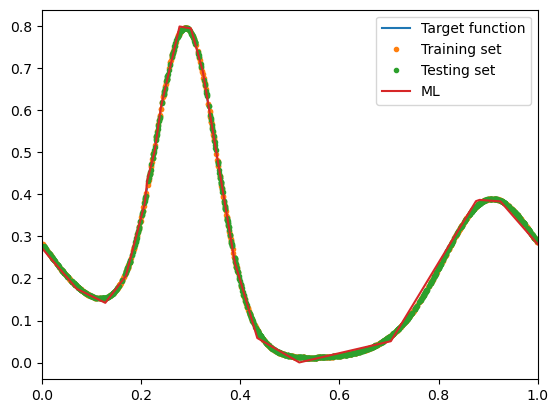

In [82]:
n = 4096
xs = np.linspace(0, 1, n, endpoint=False)
plt.plot(xs, mean_vals(n), label="Target function")
plt.plot(train_input_np, train_output_np, ".", label="Training set")
plt.plot(test_input_np, test_output_np, ".", label="Testing set")
plt.plot(
    xs, model(torch.from_numpy(xs[:, None].astype(np.float32))).detach(), label="ML"
)
plt.legend()
plt.xlim(0, 1)
# plt.ylim(ymin=0)


Experimentation shows:

* Large numbers of epochs are necessary for all optimizers
* The choice of optimizer makes a huge difference - Adam seems to be far better than SGD or Adadelta, in the sense that it converges to a decent value while the others don't
* Many many epochs seem to be necessary (100 is far from sufficient)
* It doesn't seem to matter in this setting whether the training points are presented all at once or in batches, even if they are smaller than the number of neurons
* It doesn't seem to matter in this setting whether the neurons are all in the same layer or in several
* The model is piecewise linear regardless

## Two-dimensional fitting

With one-dimensional fitting, it didn't matter what coefficients were derived, the result was always going to be piecewise linear regardless of how many layers. Will that still be true in two dimensions?

Let's use a relatively simple two-dimensional model, where our Gaussians have power-law amplitudes.

In [211]:
np.random.seed(8)
n_train = 10000
n_test = 10000
n_peaks = 4
f_low = 1.1  # GHz
f_high = 1.9  # GHz

funcs = np.array(
    [
        (
            np.exp(0.25 * np.random.standard_normal(1) - 3),
            np.exp(2 * np.random.standard_normal(1) + 1),
            np.random.uniform(size=1),
            np.random.uniform(low=-3, high=-1, size=1),
        )
        for _ in range(n_peaks)
    ]
)[:, :, 0]
print(funcs)


def sample_vals(xf):
    x, f = xf
    r = np.zeros_like(x)
    for a, kappa, loc, pwr in funcs:
        p = scipy.stats.vonmises(kappa=kappa, loc=2 * np.pi * loc)
        r += a * p.pdf(2 * np.pi * x) * 2 * np.pi * (f / f_high) ** pwr
    return r


# We're going to want this to plot the model
def gen_xf(n, m):
    x = np.linspace(0, 1, n + 1)[:, None]
    f = np.linspace(f_low, f_high, m)[None, :]
    return x, f


def mean_vals(n, m):
    x, f = gen_xf(n, m)
    r = np.zeros((n, m))
    for a, kappa, loc, pwr in funcs:
        p = scipy.stats.vonmises(kappa=kappa, loc=2 * np.pi * loc)
        r += (
            a
            * (p.cdf(x[1:] * 2 * np.pi) - p.cdf(x[:-1] * 2 * np.pi))
            * ((f / f_high) ** pwr)
        )
    return r * n


train_input_np = np.array(
    [
        np.random.uniform(size=n_train),
        np.random.uniform(low=f_low, high=f_high, size=n_train),
    ]
)
train_output_np = sample_vals(train_input_np)
test_input_np = np.array(
    [
        np.random.uniform(size=n_test),
        np.random.uniform(low=f_low, high=f_high, size=n_test),
    ]
)
test_output_np = sample_vals(test_input_np)


[[ 5.09353132e-02  2.41085239e+01  2.32728328e-01 -2.97720239e+00]
 [ 3.06003884e-02  1.69873869e-01  5.22674671e-01 -2.04321641e+00]
 [ 7.66856287e-02  2.23433218e+02  7.60895576e-01 -1.57525085e+00]
 [ 3.70362992e-02  1.25552905e+02  2.89075028e-01 -1.05228952e+00]]


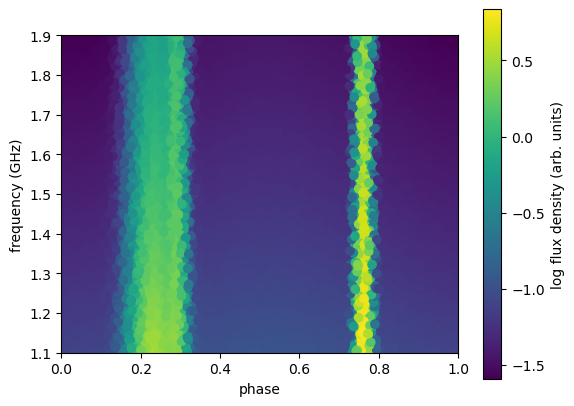

In [212]:
n_plot, m_plot = 400, 401
plt.imshow(
    np.log10(mean_vals(n_plot, m_plot).T), extent=(0, 1, f_low, f_high), origin="lower"
)
plt.xlabel("phase")
plt.ylabel("frequency (GHz)")
plt.colorbar(label="log flux density (arb. units)")

plt.scatter(train_input_np[0], train_input_np[1], c=np.log10(train_output_np))


Now let's try to train the machine to replicate this.

In [213]:
train_input = torch.from_numpy(train_input_np.T.astype(np.float32))
train_output = torch.from_numpy(train_output_np.T.astype(np.float32))
test_input = torch.from_numpy(test_input_np.T.astype(np.float32))
test_output = torch.from_numpy(test_output_np.T.astype(np.float32))


class PointDataset(Dataset):
    def __init__(self, input_tensor, output_tensor):
        self.input_tensor = input_tensor
        self.output_tensor = output_tensor

    def __len__(self):
        return len(self.input_tensor)

    def __getitem__(self, idx):
        return self.input_tensor[idx], self.output_tensor[None,idx]


train_dataset = PointDataset(train_input, train_output)
# train_dataloader = DataLoader(train_dataset, batch_size=len(test_dataset), shuffle=True)
train_dataloader = DataLoader(train_dataset, batch_size=100, shuffle=True)
# train_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True)
test_dataset = PointDataset(test_input, test_output)
test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)


In [214]:
device = "cpu"


class NeuralNetwork(nn.Module):
    def __init__(self, layers):
        super(NeuralNetwork, self).__init__()
        s = [nn.Linear(2, layers[0])]
        for n, m in zip(layers[:-1], layers[1:]):
            s.append(nn.LeakyReLU())
            s.append(nn.Linear(n, m))
        s.append(nn.LeakyReLU())
        s.append(nn.Linear(layers[-1], 1))

        self.linear_relu_stack = nn.Sequential(*s)

    def forward(self, x):
        return self.linear_relu_stack(x)


# model = NeuralNetwork([10] * 3).to(device)
# model = NeuralNetwork([10*3]).to(device)
model = NeuralNetwork([30] * 3).to(device)

print(f"Model structure: {model}\n\n")

for name, param in model.named_parameters():
    print(f"Layer: {name} | Size: {param.size()} | Values : {param[:2]} \n")


Model structure: NeuralNetwork(
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=2, out_features=30, bias=True)
    (1): LeakyReLU(negative_slope=0.01)
    (2): Linear(in_features=30, out_features=30, bias=True)
    (3): LeakyReLU(negative_slope=0.01)
    (4): Linear(in_features=30, out_features=30, bias=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Linear(in_features=30, out_features=1, bias=True)
  )
)


Layer: linear_relu_stack.0.weight | Size: torch.Size([30, 2]) | Values : tensor([[ 0.5063,  0.3729],
        [ 0.3673, -0.2460]], grad_fn=<SliceBackward0>) 

Layer: linear_relu_stack.0.bias | Size: torch.Size([30]) | Values : tensor([-0.1258,  0.5157], grad_fn=<SliceBackward0>) 

Layer: linear_relu_stack.2.weight | Size: torch.Size([30, 30]) | Values : tensor([[ 0.0564, -0.0519,  0.0280,  0.0426, -0.0642, -0.1147,  0.0768, -0.0793,
          0.1200,  0.1496,  0.1348,  0.0939,  0.0459,  0.1207, -0.1167, -0.1772,
         -0.1624,  0.0936, -0.1622,  0.0396, -0.00

In [215]:
learning_rate = 1e-2
epochs = 1000

loss_fn = nn.MSELoss()


In [216]:
# optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
# optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
optimizer = torch.optim.Adadelta(model.parameters())


def train_loop(dataloader, model, loss_fn, optimizer):
    for batch, (x, y) in enumerate(dataloader):
        pred = model(x)
        loss = loss_fn(pred, y)

        optimizer.zero_grad()
        # calling backward() here tells the optimizer that this is what should be optimized
        loss.backward()
        optimizer.step()

        print(f"mean squared error: {loss.item():>7f} [{batch:>5d}]")


def test_loop(dataloader, model, loss_fn):
    with torch.no_grad():
        for batch, (x, y) in enumerate(dataloader):
            pred = model(x)
            loss = loss_fn(pred, y)

            print(f"Test mean squared error: {loss.item():>7f}  [{batch:>5d}]\n")


for t in range(epochs):
    print(f"Epoch {t+1}\n-----------------------")
    train_loop(train_dataloader, model, loss_fn, optimizer)
    test_loop(test_dataloader, model, loss_fn)


Epoch 1
-----------------------
mean squared error: 0.857522 [    0]
mean squared error: 0.436342 [    1]
mean squared error: 0.881500 [    2]
mean squared error: 0.109575 [    3]
mean squared error: 0.271139 [    4]
mean squared error: 1.049534 [    5]
mean squared error: 0.841780 [    6]
mean squared error: 0.307331 [    7]
mean squared error: 0.835134 [    8]
mean squared error: 0.346907 [    9]
mean squared error: 0.632894 [   10]
mean squared error: 0.360210 [   11]
mean squared error: 0.977616 [   12]
mean squared error: 0.389783 [   13]
mean squared error: 0.612091 [   14]
mean squared error: 0.471076 [   15]
mean squared error: 0.230584 [   16]
mean squared error: 0.616883 [   17]
mean squared error: 0.405559 [   18]
mean squared error: 0.297364 [   19]
mean squared error: 0.694558 [   20]
mean squared error: 1.089367 [   21]
mean squared error: 0.553540 [   22]
mean squared error: 0.464927 [   23]
mean squared error: 0.320820 [   24]
mean squared error: 0.526888 [   25]
mean s

400 401
(401, 1)
(1, 401)
(400, 401)


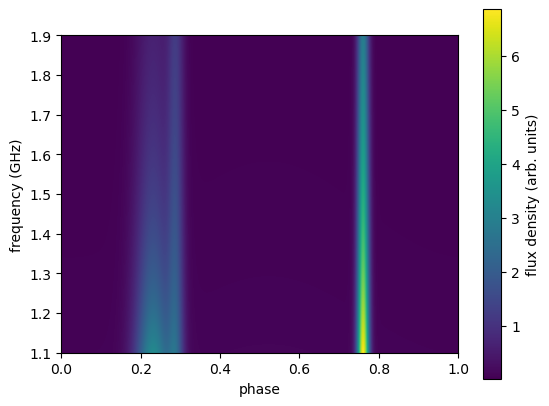

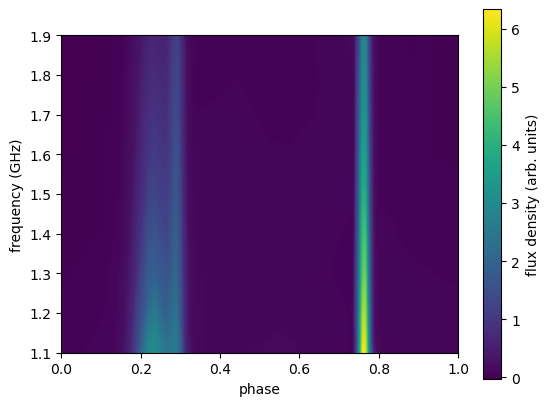

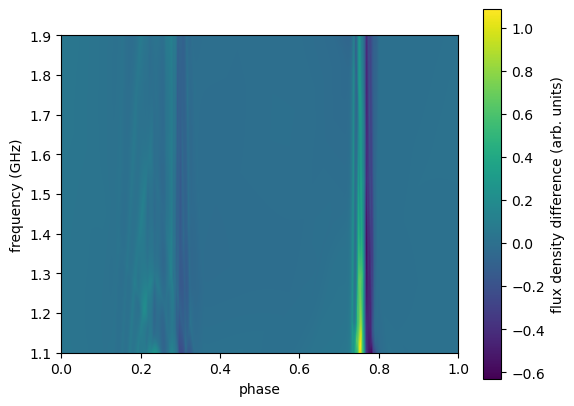

In [217]:
plt.imshow(
    mean_vals(n_plot, m_plot).T, extent=(0, 1, f_low, f_high), origin="lower"
)
plt.xlabel("phase")
plt.ylabel("frequency (GHz)")
plt.colorbar(label="flux density (arb. units)")

plt.figure()
x, f = gen_xf(n_plot, m_plot)
print(n_plot,m_plot)
print(x.shape)
print(f.shape)
x, f = np.broadcast_arrays(x[:-1], f)
print(x.shape)
inputs = np.array([x, f]).transpose((1,2,0))
assert np.array_equal(inputs, inputs.reshape(-1,2).reshape(inputs.shape))
r = model(torch.from_numpy(inputs.reshape((-1,2)).astype(np.float32))).detach().reshape(x.shape)
plt.imshow(
    r.T, extent=(0, 1, f_low, f_high), origin="lower"
)
plt.xlabel("phase")
plt.ylabel("frequency (GHz)")
plt.colorbar(label="flux density (arb. units)")

plt.figure()
plt.imshow(
    (mean_vals(n_plot, m_plot)-r.numpy()).T, extent=(0, 1, f_low, f_high), origin="lower"
)
plt.xlabel("phase")
plt.ylabel("frequency (GHz)")
plt.colorbar(label="flux density difference (arb. units)")


Here it does seem to matter if we're using batches - at least, it seems to fail using batches.

We also seem to need multiple layers now; a single layer with the same number of neurons really can't match the shape.

Taking advantage of more neurons requires a *lot* more training data.